# Исследование рынка общественного питания города Москвы

**Задачи проекта:**
    
   Подготовить исследование рынка общественного питания города Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание проекта:**
    
 Подготовлено исследование рынка о заведениях общественного питания города Москвы, визуализированы полученные данные. На основе данных выбрано место для открытия новой кофейни. 

**План работы:**
    
 1. Изучение общей информации о датасете
 2. Предобработка данных:
 - выявление дубликатов
 - выявление аномалий/выбросов
 - выявление пропущенных значений
 - создание новых столбцов
 3. Анализ данных:
 - исследование количества объектов общественного питания по категориям
 - исследование количества посадочных мест в заведениях по категориям
 - исследование сетевых и несетевых заведений в датасете
 - топ-15 популярных сетей в городе Москва
 - исследование заведений по административным районам города Москвы
 - визуализация распределения средних рейтингов по категориям заведений
 - фоновая картограмма со средним рейтингом заведений каждого района
 - отражение всех заведений на карте
 - топ-15 улиц по количеству заведений
 - исследование улиц, на которых находится только один объект общепита
 - фоновая картограмма с ценовыми индикаторами района и анализ цен в Центральном административном районе и других
 4. Исследование по открытию кофейни:
 - исследование расположения кофеен
 - исследование наличия круглосуточных кофеен
 - исследование рейтингов кофеен и их распределение по районам
 - исследование стоимости чашки капучино в кофейнях
 - распределение значений среднего чека в кофейнях Центрального административного округа города Москвы
 - Определение улиц в Центральном административном округе
 5.Общий вывод по проекту.
 6. Презентация.

 ## Изучение общей информации о датасете

In [1]:
#импортируем библиотеку pandas
import pandas as pd
#импортируем библиотеку seaborn
import seaborn as sns
#импортируем библиотеку plotly
import plotly.express as px
#импортируем библиотеку matplotlib
import matplotlib.pyplot as plt
import folium #импортируем библиотеку folium
#не устанавливать максимальное количество отображаемых строк
pd.set_option('display.max_rows', None)
#не устанавливать максимальное количество отображаемых столбцов
pd.set_option('display.max_columns', None)
import warnings #импортируем модуль управления предупреждениями
warnings.filterwarnings('ignore') #ставим фильтр для игнорирования предупреждений

In [2]:
#загружаем данные о заведениях общественного питания Москвы
data = pd.read_csv('/datasets/moscow_places.csv')
data_old = data.copy()#делаем копию исходного датафрейма
#выводим на экран общую информацию о датасете
data.info()
#выводим на экран первые пять строк датасета
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Выводы:**

Загруженный датасет содержит данные о 8 406 заведениях общественного питания города Москвы. В столбцах датасета указана основная информация об этих заведениях: название, категория, адрес расположения, район расположения, часы работы, средний чек, количество посадочных мест, признак сетевого заведения. Столбцы name, category, address, district, hours, price, avg_bill хранят информацию типа object, то есть общий для всех типов данных. Столбцы lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats хранят информацию типа float, то есть числа с плавающей строкой. Столбце chain хранит информацию типа int, то есть целые числа.    

## Предобработка данных


### Выявление дубликатов

In [3]:
data['category'].unique() #проверяем на дубликаты уникальные значения столбца category

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [4]:
data['district'].unique() #проверяем на дубликаты уникальные значения столбца district

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [5]:
data['price'].unique() #проверяем на дубликаты уникальные значения столбца price

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [6]:
data['chain'].unique() #проверяем на дубликаты уникальные значения столбца chain

array([0, 1], dtype=int64)

In [7]:
data['name'] = data['name'].str.lower() #приводим к нижнему регистру названия заведений в столбце name

In [8]:
#считаем количество дубликатов в датасете
print('Количество дубликатов по полному совпадению строк:', data.duplicated().sum())

Количество дубликатов по полному совпадению строк: 0


In [9]:
#считаем количество дубликатов по совпадению строк в столбцах name, address
print('Количество дубликатов по совпадению строк в столбцах name, address:', data.duplicated(subset=['name','address']).sum())

Количество дубликатов по совпадению строк в столбцах name, address: 3


In [10]:
#удаляем дубликаты по совпадению строк в столбцах name, address
data = data.drop_duplicates(subset=['name','address'], keep='first') 

In [11]:
#проверяем количество дубликатов по совпадению строк в столбцах name, address
print('Количество дубликатов по совпадению строк в столбцах name, address:', data.duplicated(subset=['name','address']).sum())

Количество дубликатов по совпадению строк в столбцах name, address: 0


In [12]:
#считаем количество дубликатов по совпадению строк в столбцах name, lat, lng 
print('Количество дубликатов по совпадению строк в столбцах name, lat, lng :', data.duplicated(subset=['name','lat', 'lng']).sum())

Количество дубликатов по совпадению строк в столбцах name, lat, lng : 0


In [13]:
#считаем количество дубликатов по совпадению строк в столбцах name, address, lat, lng
print('Количество дубликатов по совпадению строк в столбцах name, address, lat, lng :', data.duplicated(subset=['name','address','lat', 'lng']).sum())

Количество дубликатов по совпадению строк в столбцах name, address, lat, lng : 0


### Выявление аномалий/выбросов

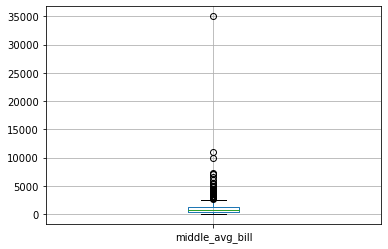

In [14]:
data.boxplot(column='middle_avg_bill'); #строим диаграмму размаха  по столбцу middle_avg_bill

In [15]:
data['middle_avg_bill'].describe() #строим статистику по столбцу middle_avg_bill

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [16]:
u = data['middle_avg_bill'].quantile(0.99)#делаем расчет quantile по столбцу middle_avg_bill
display(u)#выводим на экран результат расчета


3750.0

In [17]:
data.loc[data['middle_avg_bill'] > u]#выводим на экран выбросы по столбцу middle_avg_bill

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
317,vоdный,ресторан,"Москва, Ленинградское шоссе, 39, стр. 6",Северный административный округ,"ежедневно, 12:00–00:00",55.834978,37.479791,4.7,высокие,Средний счёт:4500–5500 ₽,5000.0,NaN,0,286.0
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
1125,на мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,NaN
1432,il barolo,ресторан,"Москва, Ленинградский проспект, 63",Северный административный округ,"ежедневно, 09:30–23:00",55.802775,37.519925,4.2,высокие,Средний счёт:3500–5000 ₽,4250.0,NaN,0,90.0
1765,крабыкутабы,ресторан,"Москва, Лесная улица, 20, стр. 4",Центральный административный округ,"пн-чт 09:00–00:00; пт,сб 09:00–01:00; вс 09:00...",55.779654,37.591582,4.7,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,180.0
2795,крошка картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3038,беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,NaN,0,150.0
3396,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3462,uhvat,ресторан,"Москва, Рочдельская улица, 15с41",Центральный административный округ,"ежедневно, 12:00–00:00",55.755983,37.561909,4.7,высокие,Средний счёт:3000–5000 ₽,4000.0,NaN,0,NaN
3476,маритим,ресторан,"Москва, Малая Грузинская улица, 23, стр. 1",Центральный административный округ,"ежедневно, 11:00–03:00",55.766043,37.571960,4.3,высокие,Средний счёт:от 5000 ₽,5000.0,NaN,0,187.0


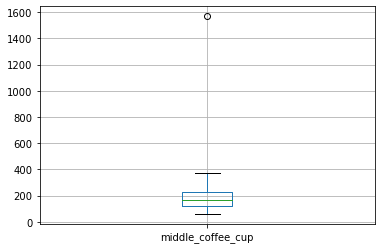

In [18]:
data.boxplot(column=['middle_coffee_cup']);#строим диаграмму размаха  по столбцу middle_coffee_cup


In [19]:
data['middle_coffee_cup'].describe()#строим статистику по столбцу middle_coffee_cup

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [20]:
y = data['middle_coffee_cup'].quantile(0.99)#делаем расчет quantile по столбцу middle_coffee_cup
display(y)#выводим на экран результат расчета

309.8999999999995

In [21]:
data.loc[data['middle_coffee_cup'] > y]#выводим на экран выбросы по столбцу middle_coffee_cup

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1769,шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.807331,37.580716,4.1,средние,Цена чашки капучино:300–350 ₽,NaN,325.0,1,61.0
2075,il tocco,кофейня,"Москва, Ходынский бульвар, 11А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–22:00",55.785455,37.530359,4.1,средние,Цена чашки капучино:280–350 ₽,NaN,315.0,0,NaN
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0
3718,кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.757292,37.595033,4.3,средние,Цена чашки капучино:279–378 ₽,NaN,328.0,1,30.0
5503,coffee fm,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.754233,37.715491,4.3,NaN,Цена чашки капучино:250–500 ₽,NaN,375.0,0,190.0
5990,диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.719000,37.582203,4.3,средние,Цена чашки капучино:250–390 ₽,NaN,320.0,0,30.0


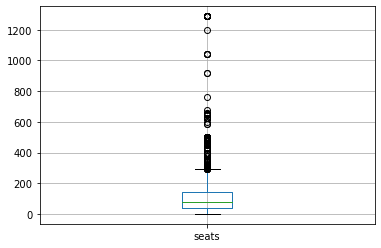

In [22]:
data.boxplot(column='seats');#строим диаграмму размаха  по столбцу seats


In [23]:
data['seats'].describe()#строим статистику по столбцу seats

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [24]:
s = data['seats'].quantile(0.99)#делаем расчет quantile по столбцу seats
display(s)#выводим на экран результат расчета

625.0

In [25]:
data.loc[data['seats'] > s]#выводим на экран выбросы по столбцу seats

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,ваня и гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2722,маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2770,шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2901,ресторан тройка,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 11:00–23:00",55.789276,37.747832,3.7,NaN,NaN,NaN,NaN,0,660.0
2913,хаус бар,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 07:00–23:00",55.789639,37.747274,3.7,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,660.0
2966,матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4180,eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.743405,37.562535,4.6,NaN,NaN,NaN,NaN,0,920.0
4231,рестобар argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
4245,стейк & бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.742953,37.561872,4.2,NaN,NaN,NaN,NaN,1,920.0
5486,дом,кафе,"Москва, улица Юности, 1",Восточный административный округ,NaN,55.736204,37.815500,4.9,NaN,NaN,NaN,NaN,0,760.0


In [26]:
data.info()#проверяем количество оставшихся столбцов датафрейма

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


### Выявление пропущенных значений

In [27]:
#считаем количество пропущенных значений в датасете
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

### Создание новых столбцов

In [28]:
#создаем новый столбец с названием улицы, выделив ее из адреса
words = ['улица', 'ул', 'переулок', 'шоссе', 'проспект', 'площадь', 'проезд', 'аллея', 'бульвар', 'набережная', 'село', 'тупик', 'линия']
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
data['street'] = data['address'].str.extract(str_pat) 

In [29]:
#создаем новый столбец с обозначением, что заведение работает ежедневно, круглосуточно с помощью функции
def is24_7(value):
    if value =='ежедневно, круглосуточно':
        return 1
    return 0

data['is_24/7'] = data['hours'].apply(is24_7)

In [30]:
#проверяем добавление новых столбцов, выводя на экран первые 15 строк датасета
data.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,0
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,0
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,0
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,0
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,0
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,0
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,0
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,0


**Выводы:**

Проверка датасета на дубликаты показала, что присутствуют 3 дубликата по совпадению наименования заведения и адреса. Дубликаты удалены. В категориальных признаках дубликатов не обнаружено.

Проверка на пропуски выявила, что присутствуют пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. По указанным столбцам устранять пропущенные значения не имеет смысла, так как мы не обладаем информацией для их заполнения, а заполнение их, например, медианой, может привести к искажению результатов анализа.

Добавлена проверка наличия выбросов/аномалий по среднему чеку и количеству мест.

## Анализ данных
### Исследование количества объектов общественного питания по категориям

In [31]:
#считаем количество заведений с группировкой по категориям
data.groupby('category')[['name']].count().sort_values(by='name', ascending=False)

,name
category,
кафе,2377
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [32]:
#импортируем набор методов graph_objects
from plotly import graph_objects as go
#строим интерактивную круговую диаграмму 
caregory_rest = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
values = [764, 256, 603, 2377, 1413, 633, 2042, 315]
fig = go.Figure(data=[go.Pie(labels=caregory_rest, values=values)])
fig.update_layout(title_text='Количество объектов общественного питания по категориям')                    
fig.show()

**Выводы:**

В данных предствлены заведения следующих категорий: кафе, ресторан, кофейня, бар, паб, пиццерия, быстрое питание, столовая, булочная.

Заведения датасета распределены по категориям следующим образом:

Наибольшее количество заведений г.Москвы являются кафе (2377 шт, что составляет 28,3% от общего) и ресторанами (2042 шт., что составляет 24,3%). Чуть меньше заведений являются кофейнями (1413 шт., что составляет 16,8%).

Наименьшее количество заведений г.Москвы является булочными (256 шт., что составляет 3,05%) и столовыми (315 шт., что составляет 3,75%).
Оставшиеся заведения распределены между категориями: бар, паб (764 - 9,09%), пиццерия (633 - 7,53%), быстрое питание (603 - 7,18%).    

### Исследование количества посадочных мест в заведениях по категориям

,seats
category,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,76.0
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


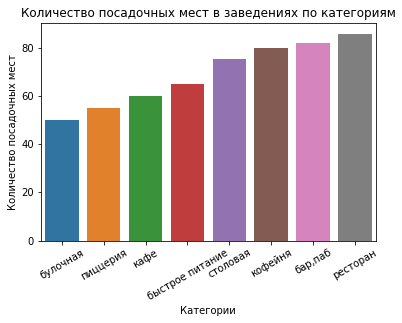

In [33]:
#считаем количество посадочных мест в заведениях с группировкой по категориям
seat_category = round(data.groupby('category')[['seats']].median().sort_values(by='seats', ascending=False), 0)
#выводим на экран итоговую таблицу
display(seat_category)
#строим столбчатую диаграмму с помощью библиотеки seaborn
ax = sns.barplot(x='category', y='seats', data=data.groupby('category').agg({'seats' : 'median'})\
                 .reset_index().sort_values(by='seats', ascending=True))
ax.set_title('Количество посадочных мест в заведениях по категориям')
ax.set_xlabel('Категории')
ax.set_ylabel('Количество посадочных мест')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30);

**Выводы:**
    
По  среднему количеству посадочных мест в заведениях распределение следующее:
лидируют рестораны (в среднем 86 мест), бары, пабы (в среднем 82 мест) и кофейни (в среднем 80 мест). Наименьшее количество посадочных мест в пиццериях (в среднем 55 мест) и булочных (в среднем 50 мест).

### Исследование сетевых и несетевых заведений в датасете

In [34]:
#определяем количество сетевых и несетевых заведений в датасете
data['chain'].value_counts()

0    5200
1    3203
Name: chain, dtype: int64

In [35]:
#строим интерактивную круговую диаграмму 
from plotly import graph_objects as go
chain_category = ['несетевые', 'сетевые']
values = [5200, 3203]
fig = go.Figure(data=[go.Pie(labels=chain_category, values=values)])
fig.update_layout(title_text='Соотношение сетевых и несетевых заведений')    
fig.show()

**Выводы:**
    
Исследование соотношения сетевых/несетевых заведений в датасете показало, что несетевых заведений больше (5200 шт, они составляют 61.9% от общего числа заведений).    

,category,chain_mean
0,"бар,паб",21.99
1,булочная,61.33
2,быстрое питание,38.47
3,кафе,32.77
4,кофейня,50.96
5,пиццерия,52.13
6,ресторан,35.70
7,столовая,27.94


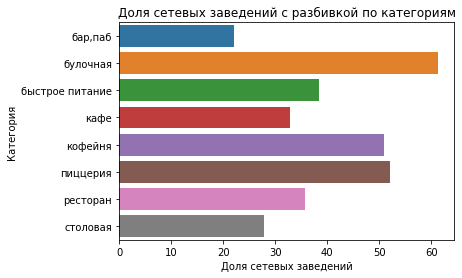

In [36]:
#считаем долю сетевых заведений с группировкой по категориям 
chain_category = data.groupby('category').agg({'chain' : 'mean'}).reset_index()
#переименовываем столбцы
chain_category.columns = ['category', 'chain_mean']
#переводим доли в проценты в столбце chain_mean
chain_category['chain_mean'] = chain_category['chain_mean'].transform(lambda x: '{:,.2%}'.format(x))
#убираем знак % в столбце chain_mean
chain_category['chain_mean'] = chain_category['chain_mean'].replace('%', '', regex=True).astype(float)
#выводим сгруппированную таблицу на экран
display(chain_category)
#строим столбчатую диаграмму
sns.barplot(data=chain_category, x='chain_mean', y='category')
plt.xlabel('Доля сетевых заведений')
plt.ylabel('Категория')
plt.title('Доля сетевых заведений с разбивкой по категориям')
plt.show() 

**Выводы:**
    
Исследование показало, что сетевыми заведениями чаще всего являются заведения таких категорий, как булочные (61,33%), пиццерии (52,13%) и кофейни (50,96%).    

### Топ-15 популярных сетей в Москве

In [37]:
#отбираем в отдельный датафрейм сетевые заведения
name_chain = data.loc[data['chain'] == 1]
#создаем итоговую таблицу, сгруппированную по наименованиям сетей и считаем их количество
name_grouped = name_chain.groupby('name')[['name']].count()
#переименовываем столбец
name_grouped.columns = ['name_count']
#сортируем итоговую таблицу по убыванию количества заведений и оставляет только первые 15 заведений
name_grouped = name_grouped.reset_index().sort_values(by='name_count', ascending=False).head(15)
#выводим итоговую таблицу на экран
display(name_grouped)

,name,name_count
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [38]:
#строим столбчатую диаграмму
fig = px.bar(name_grouped.sort_values(by='name_count', ascending=True),
            x='name_count',
            y='name',
            text='name_count')
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей в Москве',
                 xaxis_title='Количество заведений',
                 yaxis_title='Наименование заведения')
fig.show() #выводим график на экран

In [39]:
#строим сводную таблицу, к которой добавляем самые частые категории, к которым относятся заведения из топ-15
cat_name_chain = name_chain.groupby('name').agg({'address': 'nunique', 'category' : pd.Series.mode})\
.sort_values(by='address', ascending=False).head(15)
#переименовываем столбцы
cat_name_chain.columns = ['name_count', 'category']
#на основании сводной таблицы cat_name_chain строим новую сводную таблицу количества заведений из топ-15,
#сгруппированных по категориям
cat_name = cat_name_chain.groupby('category')[['name_count']].sum().reset_index()
#переименовываем столбцы
cat_name.columns = ['category', 'name_count']
#выводим на экран сводную таблицу
display(cat_name)

,category,name_count
0,булочная,32
1,кафе,147
2,кофейня,330
3,пиццерия,150
4,ресторан,157


In [40]:
#строим столбчатую диаграмму
fig = px.bar(cat_name.sort_values(by='name_count', ascending=True),
            x='category',
            y='name_count',
            text='name_count')
#оформляем график
fig.update_layout(title='Количество заведений из Топ-15, сгруппированных по категориям заведений',
                 xaxis_title='Наименование категории',
                 yaxis_title='Количество заведений')
fig.show() #выводим график на экран

**Выводы:**
    
Анализ показал, что к топ-15 самых популярных сетевых заведений г.Москвы относятся кофейня Шоколадница (120 мест), Доминос Пицца (76 мест), Додо Пицца (74 места) и другие.
Первые три заведения из топ-15 известны не только в городе Москва, но и в других городах России.
Что касается распределения по категориям, то в топ-15 попали 330  кофеен, 157 ресторанов, 150 пиццерий, 145 кафе, 32 булочные. 

### Исследование заведений по административным районам г.Москвы

Выводы:



In [41]:
#выводим на экран уникальные значения столбца district
print(data['district'].unique())
#выводим на экран  общее количество заведений с группировкой по административным районам
data.groupby('district').agg({'name' : ['count']}).reset_index()

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


,district,name
,,count
0,Восточный административный округ,798
1,Западный административный округ,850
2,Северный административный округ,899
3,Северо-Восточный административный округ,890
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [42]:
#строим сводную таблицу с двойной группировкой: по району и по категории
district_name = data.groupby(['district', 'category']).agg({'name' : ['count']}).reset_index()
#переименовываем столбцы
district_name.columns = ['district', 'category', 'name_count']
#строим столбчатую диаграмму с накоплением
fig = px.bar(district_name, x='district', y='name_count', color='category', text='name_count')
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по округам',
                 xaxis_title='Наименование округа',
                 yaxis_title='Количество заведений',
                 barmode='stack',
                 xaxis={'categoryorder':'total descending'})
fig.show() #выводим график на экран

**Выводы:**
    
Исследование показало, что в датасете присутствуют следующие административные районы г.Москвы: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ,
Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ.

Наибольшее количество заведений находится в Центральном административном округе (2242 места), при этом больше всего там ресторанов (670 мест), чуть меньше кафе (464 места) и кофеен (428 мест).
Меньше всего в Центральном административном округе булочных (50 мест) и столовых (66 мест).
Наименьшее количество заведений находится в Северо-Западном административном округе (409 мест). Из них преобладают кафе (115 мест), на втором месте рестораны (109 мест), кофеен всего 62 места.

Следует отметить, что в остальных административных округах по количеству заведений лидируют кафе, а рестораны отстают по количеству заведений.  
    

### Визуализация распределения средних рейтингов по категориям заведений

,category,rating
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


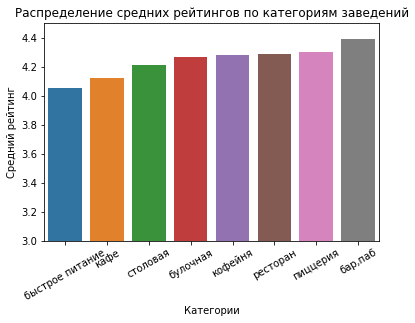

In [43]:
#формируем сводную таблицу с группировкой по категориям
rating_category = round(data.groupby(['category']).agg ({'rating' : ['mean']}).reset_index(), 2)
#переименовываем столбцы
rating_category.columns = ['category', 'rating']
#выводим сводную таблицу на экран
display(rating_category)
#строим столбчатую диаграмму
ax = sns.barplot(x='category', y='rating', data=rating_category.sort_values(by='rating'))
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_xlabel('Категории')
ax.set_ylabel('Средний рейтинг')
ax.set_ylim([3, 4.5])
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30);

**Выводы:**
    
Визуализация распределения средних рейтингов по категориям заведений показала, что все категории заведений, представленных в городе Москве, имеют достаточно хороший рейтинг - выше 4. При этом кардинального различия между усредненными рейтингами в разных типах общепита нет, различие на сотые доли. Самый высокий средний рейтинг у заведений категории "бар, паб" - 4.39, самый низкий - у заведений  категории "быстрое питание" - 4.05.    

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [44]:
#строим сводную таблицу с группировкой по районам Москвы
district_rating = round(data.groupby('district', as_index=False)['rating'].agg('mean'), 2)
#выводим на экран сводную таблицу
display(district_rating)


,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [45]:
# подключаем модуль для работы с JSON-форматом
import json
# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)    

In [46]:
# импортируем карту и хороплет
from folium import Map,Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
geo_data=state_geo,
data=district_rating,
columns=['district', 'rating'],
key_on='feature.name',
fill_color='YlGn',
fill_opasity=0.8,
legend_name='Средний рейтинг заведений каждого округа',
).add_to(m)
#выводим карту
m

**Выводы:**
    
Фоновая картограмма показывает, что наибольший средний рейтинг у заведений, находящихся в Центральном административном округе (4.38), наименьший средний рейтинг у заведений, находящихся в Юго-Восточном административном округе (4.10). В целом, же существенного различия между средними рейтингами разных административных округов нет.      

### Отражение всех заведений на карте

In [47]:
#импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#пишем функцию, которая принимает строку датафрейма,
#создаем маркер в текущей точке и добавляет его в marker_cluster
def create_clusters(row):
    Marker(
    [row['lat'], row['lng']],
    popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
#применяем функцию create_clusters к каждой строке датафрейма     
data.apply(create_clusters, axis=1)  
# выводим карту
m

### Топ-15 улиц по количеству заведений

In [48]:
#создаем сводную таблицу, в которой находим топ-15 улиц по количеству заведений
street_rest = data.groupby('street').agg({'name' : 'count'}).reset_index().sort_values(by='name', ascending=False).head(15)
#выводим сводную таблицу на экран
display(street_rest)

,street,name
1017,проспект Мира,183
744,Профсоюзная улица,122
1014,проспект Вернадского,108
503,Ленинский проспект,107
501,Ленинградский проспект,95
355,Дмитровское шоссе,88
436,Каширское шоссе,77
286,Варшавское шоссе,75
502,Ленинградское шоссе,69
522,Люблинская улица,60


In [49]:
#сохраняем в отдельную переменную столбец street из датафрейма street_rest
top_15 = street_rest['street']
#формируем срез из исходного датафрейма, отбирая только улицы, которые входят в топ-15
street_rest_15 = data.query('street in @top_15')
#строим сводную таблицу по количеству заведений с группировкой по улице и категории
street_rest_15 = street_rest_15.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
#переименовываем столбцы
street_rest_15.columns = ['street', 'category', 'name_count']
# выводим на экран сводную таблицу
display(street_rest_15)

,street,category,name_count
0,Алтуфьевское шоссе,"бар,паб",5
1,Алтуфьевское шоссе,булочная,1
2,Алтуфьевское шоссе,быстрое питание,5
3,Алтуфьевское шоссе,кафе,13
4,Алтуфьевское шоссе,кофейня,9
5,Алтуфьевское шоссе,пиццерия,3
6,Алтуфьевское шоссе,ресторан,10
7,Алтуфьевское шоссе,столовая,1
8,Варшавское шоссе,"бар,паб",6
9,Варшавское шоссе,быстрое питание,7


In [50]:
#строим столбчатую диаграмму с накоплением
fig = px.bar(street_rest_15,
             x='street',
             y='name_count',
             color='category',
             text='name_count')
#оформляем график
fig.update_layout(title='Топ-15 улиц по количеству заведений с разбивкой по категориям',
                 xaxis_title='Наименование улицы',
                 yaxis_title='Количество заведений',
                 barmode='stack',
                 xaxis={'categoryorder':'total descending'})
fig.show() #выводим график на экран

**Выводы:**
    
В топ-15 улиц по количеству заведений лидером является проспект Мира, на нем находится 183 объекта общественного питания.
Из них 53 кафе, 45 ресторанов, 36 кофеен, остальные категории представлены в гораздо меньшем количестве.

### Исследование улиц, на которых находится только один объект общепита

In [51]:
#создаем новый датафрейм, в котором оставляем только улицы, которые встречаются только один раз в исходном датафрейме 
data_street = data.drop_duplicates(keep=False, subset=['street']).reset_index(drop=True)

In [52]:
#формируем сводную таблицу по общему количеству заведений с группировкой по району
one_name = data_street.pivot_table(index='district', values='street', aggfunc='count').reset_index()
#переименовываем столбцы
one_name.columns = ['district', 'one_name_count']
#выводим на экран сводную таблицу
display(one_name)
#строим линейный график
fig = px.line(one_name, x='district', y='one_name_count', title='Распределение заведений, которые являются единственными на улице, по районам')
#оформляем график
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Hаименование округа',
                 yaxis_title='Количество заведений')
#оформляем график
fig.show()

,district,one_name_count
0,Восточный административный округ,48
1,Западный административный округ,35
2,Северный административный округ,46
3,Северо-Восточный административный округ,49
4,Северо-Западный административный округ,18
5,Центральный административный округ,135
6,Юго-Восточный административный округ,32
7,Юго-Западный административный округ,15
8,Южный административный округ,36


In [53]:
#строим итоговую таблицу по количеству заведений с группировкой по району и категории
name_one_category = data_street.pivot_table(index='category', values='street', aggfunc='count').reset_index()
#переименовываем столбцы
name_one_category.columns = ['category', 'name_count_one']
#выводим итоговую таблицу на экран
display(name_one_category)
#строим линейный график
fig = px.line(name_one_category, x='category', y='name_count_one', title='Распределение заведений, которые являются единственными на улице, по категориям')
#оформляем график
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Hаименование категории',
                 yaxis_title='Количество заведений')
#выводим график на экран
fig.show()

,category,name_count_one
0,"бар,паб",40
1,булочная,9
2,быстрое питание,17
3,кафе,137
4,кофейня,73
5,пиццерия,14
6,ресторан,88
7,столовая,36


**Выводы:**

Исследование показало, что улиц, на которых находится только один объект общепита, больше всего находится в Центральном административном округе (135 улиц). Чаще всего эти объекты общепита относятся к категории "кафе" - 137 мест, "ресторан" - 88 мест , "кофейня" - 73 места.

### Фоновая картограмма с ценовыми индикаторами района и анализ цен в Центральном административном округе и других

In [54]:
#считаем медианное значение среднего чека заведений с группировкой по округам
district_avg_bill = data.groupby('district', as_index=False).agg({'middle_avg_bill' : 'median'})
#выводим на экран итоговую таблицу
display(district_avg_bill)

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [55]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


In [56]:
# импортируем карту и хороплет
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m=Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
       geo_data=state_geo,
       data=district_avg_bill,
       columns=['district', 'middle_avg_bill'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opasity=0.8,
        legend_name='Медианный средний чек по округам'
        ).add_to(m)
#выводим карту
m

In [57]:
#создаем категории для населенных пунктов
data['district_category'] = 'Другие округа'
data.loc[data['district'] == 'Центральный административный округ', 'district_category'] = 'Центральный административный округ'

In [58]:
#строим гистограммы
fig = px.histogram(data,
                  x='middle_avg_bill',
                   color='district_category',
                   range_x=[0, 1200],
                   title='Распределение значений средних чеков в центральном административном округе и других',
                   nbins=1000,
                   barmode='overlay')
#оформляем график
fig.update_xaxes(title_text='Значение')
fig.update_yaxes(title_text='Частота')
#выводим график
fig.show()

**Выводы:**

Анализ данных показывает, что наибольшее медианное значение  среднего чека в заведениях - в Центральном административном округе и Западном административном округе - 1000 руб.
Наименьшее же медианное значение среднего чека - в Юго-Восточном административном округе (450 руб.).

Что касается распределения средних чеков в Центральном административном округе и других, то график показывает, что в отличие от Центрального административного округе, где клиенты чаще всего оплачивают в чеке в районе 1000-1049 руб., в других районах г.Москвы - средний чек чаще всего бывает в пределах 300-349 руб.

Таким образом, цены в заведениях напрямую зависят от удаленности от центра, но также и зависят от престижности района г.Москвы. 

**Общий вывод по п.3:**
    
Наибольшее количество заведений г.Москвы являются кафе (2377 шт, что составляет 28,3% от общего) и ресторанами (2042 шт., что составляет 24,3%). Чуть меньше заведений являются кофейнями (1413 шт., что составляет 16,8%).

По  среднему количеству посадочных мест в заведениях распределение следующее:
лидируют рестораны (в среднем 86 мест), бары, пабы (в среднем 82 мест) и кофейни (в среднем 80 мест). 

Исследование соотношения сетевых/несетевых заведений в датасете показало, что несетевых заведений больше (5200 шт, они составляют 61.9% от общего числа заведений).    

Исследование показало, что сетевыми заведениями чаще всего являются заведения таких категорий, как булочные (61,33%), пиццерии (52,13%) и кофейни (50,96%).    

Анализ показал, что к топ-15 самых популярных сетевых заведений г.Москвы относятся кофейня Шоколадница (120 мест), Доминос Пицца (76 мест), Додо Пицца (74 места) и другие.
Первые три заведения из топ-15 известны не только в городе Москва, но и в других городах России.
Что касается распределения по категориям, то в топ-15 попали 330  кофеен, 157 ресторанов, 150 пиццерий, 145 кафе, 32 булочные. 

Наибольшее количество заведений находится в Центральном административном округе (2242 места), при этом больше всего там ресторанов (670 мест), чуть меньше кафе (464 места) и кофеен (428 мест).
Меньше всего в Центральном административном округе булочных (50 мест) и столовых (66 мест).
Наименьшее количество заведений находится в Северо-Западном административном округе (409 мест). Из них преобладают кафе (115 мест), на втором месте рестораны (109 мест), кофеен всего 62 места.
Следует отметить, что в остальных административных округах по количеству заведений лидируют кафе, а рестораны отстают по количеству заведений.

Визуализация распределения средних рейтингов по категориям заведений показала, что все категории заведений, представленных в городе Москве, имеют достаточно хороший рейтинг - выше 4. При этом кардинального различия между усредненными рейтингами в разных типах общепита нет, различие на сотые доли. 

Фоновая картограмма показывает, что наибольший средний рейтинг у заведений, находящихся в Центральном административном округе (4.38), наименьший средний рейтинг у заведений, находящихся в Юго-Восточном административном округе (4.10). В целом, же существенного различия между средними рейтингами разных административных округов нет.    

В топ-15 улиц по количеству заведений лидером является проспект Мира, на нем находится 183 объекта общественного питания.
Из них 53 кафе, 45 ресторанов, 36 кофеен, остальные категории представлены в гораздо меньшем количестве.

Исследование показало, что улиц, на которых находится только один объект общепита, больше всего находится в Центральном административном округе (135 улиц). Чаще всего эти объекты общепита относятся к категории "кафе" - 137 мест, "ресторан" - 88 мест , "кофейня" - 73 места.

Анализ данных показывает, что наибольшее медианное значение  среднего чека в заведениях - в Центральном административном округе и Западном административном округе - 1000 руб.
Наименьшее же медианное значение среднего чека - в Юго-Восточном административном округе (450 руб.).

Что касается распределения средних чеков в Центральном административном округе и других, то график показывает, что в отличие от Центрального административного округе, где клиенты чаще всего оплачивают в чеке в районе 1000-1049 руб., в других районах г.Москвы - средний чек чаще всего бывает в пределах 300-349 руб.

Таким образом, можно сделать общий вывод о том, что Центральный административный округ, как центр притяжения туристов, лидирует как по количеству заведений, так и по более высокому уровню заведений, в частности, такие как рестораны, кафе и кофейни. Медианный средний чек в Центральном административном округе один из самых высоких - 1000 руб. Но также следует отметить, что на уровень цен в объектах общепита влияет также и престижность округа г.Москвы. Например, в Западном административном округе также медианное значение среднего чека составляет 1000 руб., при том, что количество заведений общепита гораздо меньше, чем в ЦАО.
Что касается других районов, удаленных от центра, то количество заведений общепита в них значительно меньше. Рестораны, как наиболее высокий уровень заведений, присутствуют в меньшем количестве, больше преобладают кафе и другие категории. И средний чек в этих районах значительно меньше по сравнению с Центральным административным округом.

## Исследование по открытию кофейни

### Исследование расположения кофеен

In [59]:
#создаем новый датафрейм с данными по кофейням г.Москвы
cafe = data.loc[data['category'] =='кофейня']
#создаем сводную таблицу по количеству кофеен, с группировкой по округам 
cafe_district = cafe.groupby('district')[['name']].count().sort_values(by='name', ascending=False)
#выводим на экран итоговую таблицу
display(cafe_district)

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [60]:
#импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#пишем функцию, которая принимает строку датафрейма,
#создаем маркер в текущей точке и добавляет его в marker_cluster
def create_clusters(row):
    Marker(
    [row['lat'], row['lng']],
    popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
#применяем функцию create_clusters к каждой строке датафрейма     
cafe.apply(create_clusters, axis=1)  
# выводим карту
m

**Выводы:** 
    
Самое большое число кофеен ожидаемо располагается в Центральном административном округе (428 мест). Меньше всего кофеен располагается в Северо-Западном административном округе (62 места).    

### Исследование наличия круглосуточных кофеен

In [61]:
#отбираем данные с круглосуточными кофейнями
cafe_24 = cafe.loc[cafe['is_24/7'] == 1]
#считаем общее количество круглосуточных кофеен
print('Общее количество круглосуточных кофеен в г.Москве:', cafe_24['name'].count())
#считаем количество каждой из круглосуточных кофеен
cafe_24['name'].value_counts()

Общее количество круглосуточных кофеен в г.Москве: 59


шоколадница           17
кофемания              8
wild bean cafe         6
wild bean              5
кофе хауз              3
you&coffee             2
cofix                  2
кофе с собой           2
столица                1
the wild bean cafe     1
foodmoscowcoffee       1
one&double             1
кофе on                1
лаванда кофе           1
пирог хауз             1
one and double         1
гоголь-моголь          1
молоко                 1
кофейня one&double     1
one price coffee       1
cinnabon               1
one more, please       1
Name: name, dtype: int64

In [62]:
#подключаем библиотеку
from folium import Marker, Map
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
#создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#пишем функцию, которая принимает строку датафрейма,
#создаем маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
          popup=f"{row['name']} {row['rating']}"
          ).add_to(m)
#применяем функцию для создания маркера ко всем строкам датафрейма        
cafe_24.apply(create_marker, axis=1)
#выводим карту
m
    

**Выводы:**
    
Исследование показало, что в Москве всего 59 круглосуточных кофеен. Из них большая часть расположена в Центральном административном округе, так как основная часть жителей города и туристов отдыхает и развлекается именно в центре г.Москвы.
Самое большое число круглосуточных кофеен у сети Шоколадница, которая является самой популярной сетью среди топ-15 сетевых заведений города.

### Исследование рейтингов кофеен и их распределения по районам

In [63]:
#формируем итоговую таблицу по среднему рейтингу с группировкой по округам
rat_dist_cafe = round(cafe.groupby('district')[['rating']].agg('mean').reset_index(), 2)
#переименовываем столбцы
rat_dist_cafe.columns = ['district', 'rating']
#выводим на экран сводную таблицу
display(rat_dist_cafe)

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [64]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)    

In [65]:
# импортируем карту и хороплет
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m=Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
       geo_data=state_geo,
       data=rat_dist_cafe,
       columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opasity=0.8,
        legend_name='Средний рейтинг кофеен каждого округа'
        ).add_to(m)
#выводим карту
m

**Выводы:**
    
Средний рейтинг кофеен по районам города примерно одинаков - выше 4. Различия между районами в сотых долях.    

### Исследование стоимости чашки капучино в кофейнях

In [66]:
#создаем сводную таблицу с расчетом средней стоимости чашки капучино в кофейнях с группировкой по районам
cap_cafe = cafe.groupby(['district'])[['middle_coffee_cup']].agg('median').reset_index().sort_values(by='middle_coffee_cup', ascending=False)
#выводим на экран сводную таблицу
display(cap_cafe)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [67]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [68]:
# импортируем карту и хороплет
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m=Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
       geo_data=state_geo,
       data=cap_cafe,
       columns=['district', 'middle_coffee_cup'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opasity=0.8,
        legend_name='Медианный средний чек чашки капучино по округам'
        ).add_to(m)
m

**Выводы:**
    
Медианная стоимость чашки капучино  самая высокая в Юго-Западном административном округе - 198 руб., в Центральном административном округе - чуть ниже - 190 руб.
Самая низкая стоимость чашки капучино - в Восточном административном округе - 135 руб.

### Распределение значений среднего чека в кофейнях Центрального административного округа

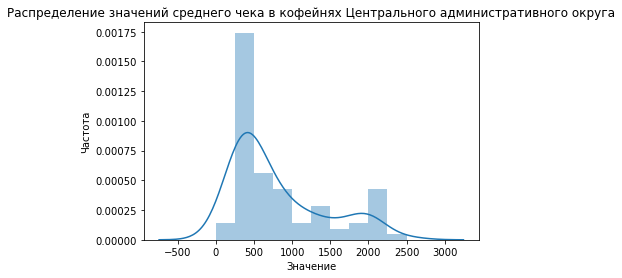

In [69]:
#отбираем данные только по кофейням, которые располагаются в Центральном административном округе
cafe_cao = cafe.loc[cafe['district'] == 'Центральный административный округ']
#строим график распределения среднего чека в кофейнях ЦАО
ax = sns.distplot(cafe_cao['middle_avg_bill'], bins=10)
ax.set_title('Распределение значений среднего чека в кофейнях Центрального административного округа')
ax.set_xlabel('Значение')
ax.set_ylabel('Частота');

**Выводы:**
    
Средний чек кофеен, которые располагаются в Центральном административном округе, чаще всего приблизительно 350 руб.    

### Определение улиц в Центральном административном округе для открытия новой кофейни

In [70]:
#формируем новый датасет, в котором оставляем только улицы, которые встречаются в исходном датасете
#только один раз, то есть на которых располагается только один объект общепита
street_one = data.drop_duplicates(keep=False, subset=['street']).reset_index(drop=True)
#из улиц ЦАО, на которых располагается только один объект общепита, отбираем в отдельный датасет улицы, 
#на которых располагаются заведения других категорий, кроме кофеен, категория цен в которых "высокие"
street_one_ = street_one.loc[(street_one['category'] != 'кофейня')\
                             & (street_one['district'] == 'Центральный административный округ')\
                             & (street_one['price'] == 'высокие')]
#выводим на экран полученные улицы
display(street_one_['street'])

113                 Самарская улица
183                улица Климашкина
184              Конюшковская улица
203            Дмитровский переулок
206        2-я Звенигородская улица
222           1-я Фрунзенская улица
223               Денежный переулок
226    1-й Николощеповский переулок
228            Нащокинский переулок
231            Гагаринский переулок
238              Пожарский переулок
250            улица Малая Якиманка
264       Малый Ивановский переулок
290                 улица Высоцкого
294          Старомонетный переулок
Name: street, dtype: object

In [71]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [72]:
#импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#пишем функцию, которая принимает строку датафрейма,
#создаем маркер в текущей точке и добавляет его в marker_cluster
def create_clusters(row):
    Marker(
    [row['lat'], row['lng']],
    popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
#применяем функцию create_clusters к каждой строке датафрейма     
street_one_.apply(create_clusters, axis=1)  
# выводим карту
m

**Выводы:**
    
В связи с тем, что инвесторы хотят открыть такую же кофейню, как "Central Perk", то она должна располагаться в Центральной части г.Москвы, так это самый часто посещаемый район г.Москвы, как туристами, так и жителями города, которые часто работают в центре или отдыхают в центре.
Исследование выявило ряд улиц, на которых находится только один объект общепита, и это не кофейня. Это заведения с высокими уровнем цен, то есть не для каждого.
Список улиц: Самарская улица,
             улица Климашкина,
             Конюшковская улица,
             Дмитровский переулок,
             2-я Звенигородская улица,
             1-я Фрунзенская улица,
             Денежный переулок,
             1-й Николощеповский переулок,
             Нащокинский переулок,
             Гагаринский переулок,
             Пожарский переулок,
             улица Малая Якиманка,
             Малый Ивановский переулок,
             улица Высоцкого,
             Старомонетный переулок

Каждую из этих улиц необходимо оценить на проходимость и присутствие на соседних улицах конкурентов, и на основании этого выбрать наиболее выгодный вариант размещения кофейни.

## Общий вывод по проекту:

Самое большое число кофеен ожидаемо располагается в Центральном административном округе 

Исследование показало, что в Москве всего 59 круглосуточных кофеен. Из них большая часть расположена в Центральном административном округе, так как основная часть жителей города и туристов отдыхает и развлекается именно в центре г.Москвы.
Самое большое число круглосуточных кофеен у сети Шоколадница, которая является самой популярной сетью среди топ-15 сетевых заведений города.

Средний рейтинг кофеен по районам города примерно одинаков - выше 4. 

Медианная стоимость чашки капучино  самая высокая в Юго-Западном административном округе - 198 руб., в Центральном административном округе - чуть ниже - 190 руб.
Самая низкая стоимость чашки капучино - в Восточном административном округе - 135 руб.

**Рекомендации по открытию кофейни:**

В связи с тем, что инвесторы хотят открыть такую же крутую и доступную кофейню, как "Central Perk", то она должна располагаться в Центральной части г.Москвы, так это самый часто посещаемый район г.Москвы, как туристами, так и жителями города, которые часто работают в центре или отдыхают в центре.
Исследование выявило ряд улиц, на которых находится только один объект общепита, и это не кофейня. Это заведения с высокими уровнем цен, то есть не для каждого.
Список улиц: Самарская улица,
             улица Климашкина,
             Конюшковская улица,
             Дмитровский переулок,
             2-я Звенигородская улица,
             1-я Фрунзенская улица,
             Денежный переулок,
             1-й Николощеповский переулок,
             Нащокинский переулок,
             Гагаринский переулок,
             Пожарский переулок,
             улица Малая Якиманка,
             Малый Ивановский переулок,
             улица Высоцкого,
             Старомонетный переулок

Каждую из этих улиц необходимо оценить на проходимость и присутствие на соседних улицах конкурентов, и на основании этого выбрать наиболее выгодный вариант размещения кофейни.

Средний чек кофеен в ЦАО приблизительно 350 руб.,  а средний чек в заведениях на указанных улицах в районе 1500-2000 руб. Скорее всего, потенциальные клиенты, которые просто хотят выпить чашку кофе, скорее пойдут в кофейню, чем в дорогостоящее заведение.

Режим работы стоит установить с 8 до 23 часов, так как именно в это время проходимость по улицам города наиболее высокая. В ночное время людей, которые хотят выпить кофе, гораздо меньше.

В связи с отсутствием данных о стоимости чашки капучино в заведениях, которые располагаются на указанных выше улицах, во вновь открываемой кофейне стоит установить среднюю стоимость чашки капучино в Центральном административном округе - 190 руб. Так как это заведения с высокой категорией цен, то вероятнее всего, в них чашка капучино стоит выше среднего по ЦАО.


## Презентация

Презентация: [Яндекс.Диск](https://disk.yandex.ru/client/disk/Презентации)